# **Setup and Imports**

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from sklearn.metrics import classification_report, confusion_matrix
sns.set(style="whitegrid", palette="colorblind", font_scale=1.2)

# **Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls "/content/drive/MyDrive/Colab Notebooks/intel_image_classification/"

seg_pred  seg_test  seg_train


# **Load and Explore the Dataset**

📁 Class distribution plot saved as: class_distribution.png


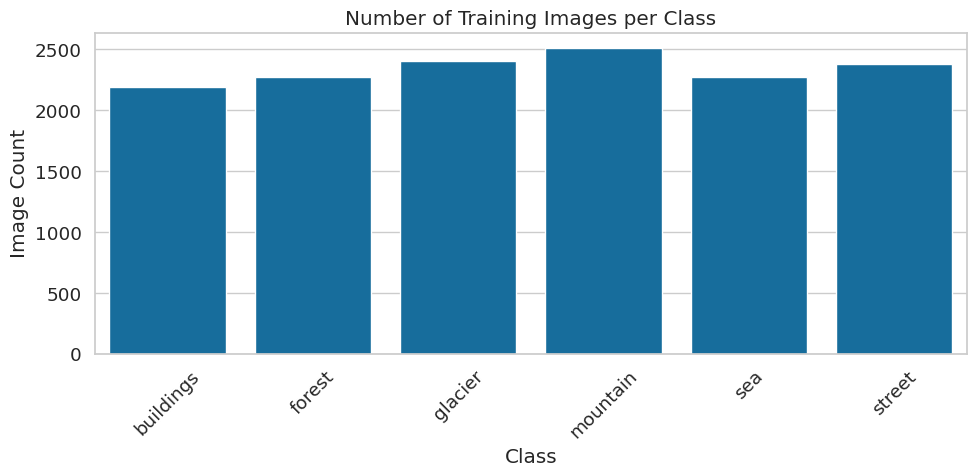

In [ ]:
import os
#Train Path
train_path = "/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_train/seg_train"

def explore_dataset(train_dir, output_path="class_distribution.png"):
    class_counts = {}
    class_labels = []

    for class_name in sorted(os.listdir(train_dir)):
        class_path = os.path.join(train_dir, class_name)
        if os.path.isdir(class_path) and not class_name.startswith("."):
            image_files = [f for f in os.listdir(class_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
            count = len(image_files)
            if count > 0:
                class_counts[class_name] = count
                class_labels.append(class_name)

    # Plot class distribution
    plt.figure(figsize=(10, 5))
    sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
    plt.title("Number of Training Images per Class")
    plt.xlabel("Class")
    plt.ylabel("Image Count")
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Save the plot
    plt.savefig(output_path)
    print(f"📁 Class distribution plot saved as: {output_path}")
    plt.show()

    return class_counts

# 🔁 Run the function
class_counts = explore_dataset(train_path)


# **Show Sample Images per Class**

Sample image grid saved as: sample_images.png


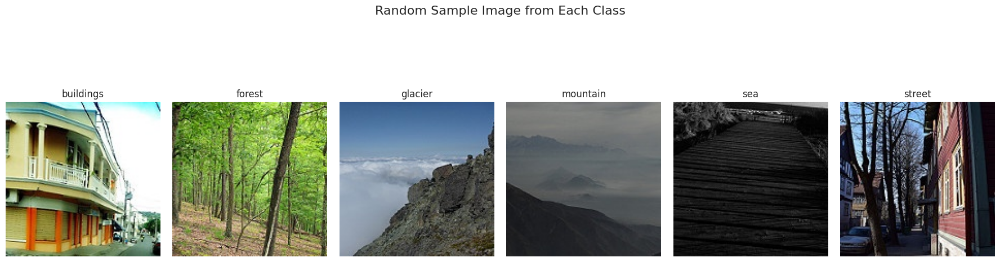

In [ ]:
import matplotlib.image as mpimg
def show_sample_images(train_dir, output_path="sample_images.png"):
    class_names = sorted(os.listdir(train_dir))
    class_names = [cls for cls in class_names if not cls.startswith(".")]

    plt.figure(figsize=(18, 6))

    for idx, cls in enumerate(class_names):
        img_folder = os.path.join(train_dir, cls)
        img_file = random.choice([
            f for f in os.listdir(img_folder)
            if f.lower().endswith(('.jpg', '.jpeg', '.png'))
        ])
        img_path = os.path.join(img_folder, img_file)
        img = mpimg.imread(img_path)

        plt.subplot(1, len(class_names), idx + 1)
        plt.imshow(img)
        plt.title(cls, fontsize=12)
        plt.axis('off')

    plt.suptitle("Random Sample Image from Each Class", fontsize=16)
    plt.tight_layout()
    plt.savefig(output_path)
    print(f"Sample image grid saved as: {output_path}")
    plt.show()

# Use the correct path
show_sample_images("/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_train/seg_train")


# **Rotation Augmentation**

✅ Rotation augmentation saved as: aug_rotation.png


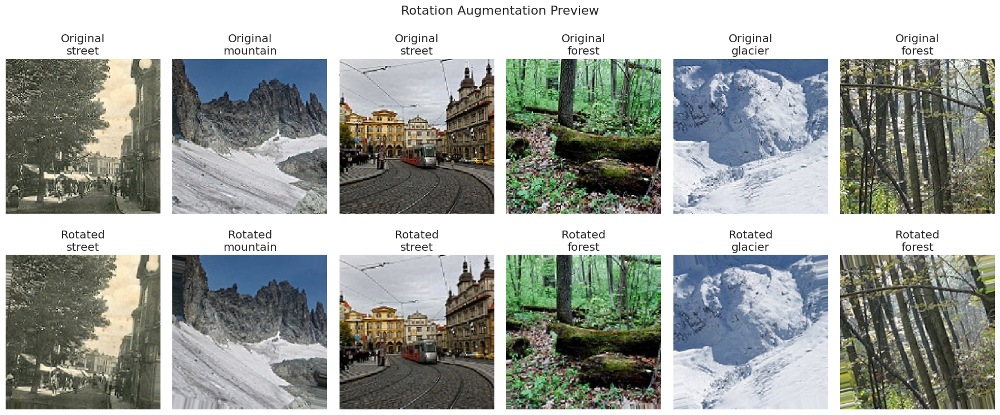

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os
import random

def preview_rotation_augmentation(data_dir, target_size=(224, 224), num_images=6, output_path="aug_rotation.png"):
    datagen = ImageDataGenerator(rotation_range=40)

    # Get class folders
    class_folders = [d for d in os.listdir(data_dir) if not d.startswith(".")]
    sample_images = []

    # Pick random images from random classes
    for _ in range(num_images):
        class_choice = random.choice(class_folders)
        img_folder = os.path.join(data_dir, class_choice)
        img_file = random.choice([f for f in os.listdir(img_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        img_path = os.path.join(img_folder, img_file)
        sample_images.append((img_path, class_choice))

    # Plot
    plt.figure(figsize=(18, 8))
    for i, (img_path, label) in enumerate(sample_images):
        # Load and preprocess
        img = load_img(img_path, target_size=target_size)
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)

        # Generate rotated image
        aug_iter = datagen.flow(img_array, batch_size=1)
        rotated_img = next(aug_iter)[0].astype("uint8")

        # Plot original
        plt.subplot(2, num_images, i + 1)
        plt.imshow(img_array[0].astype("uint8"))
        plt.title(f"Original\n{label}")
        plt.axis('off')

        # Plot rotated
        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow(rotated_img)
        plt.title(f"Rotated\n{label}")
        plt.axis('off')

    plt.suptitle("Rotation Augmentation Preview", fontsize=16)
    plt.tight_layout()
    plt.savefig(output_path)
    print(f"✅ Rotation augmentation saved as: {output_path}")
    plt.show()

# 🔁 Run it
preview_rotation_augmentation("/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_train/seg_train")


# **CLAHE Contrast Enhancement**

✅ CLAHE augmentation saved as: aug_clahe.png


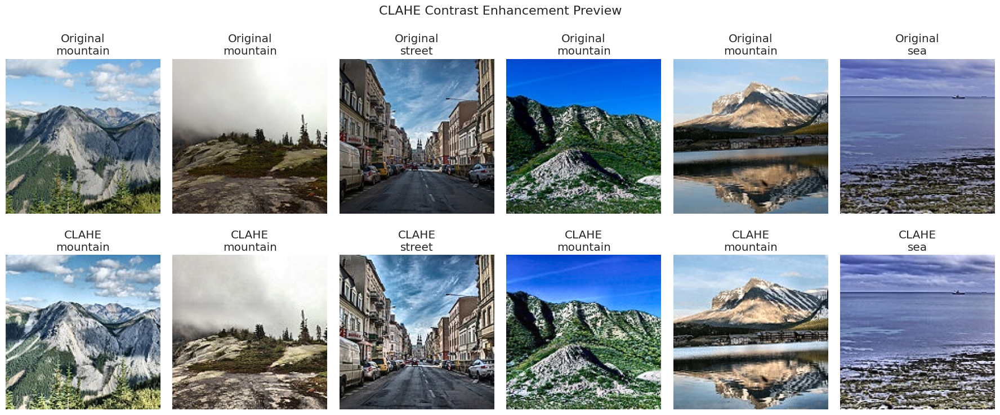

In [ ]:
import cv2
import matplotlib.pyplot as plt
import random
import os

def apply_clahe(image_path, tile_grid_size=(8, 8), clip_limit=2.0):
    img = cv2.imread(image_path)  # BGR format
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    cl = clahe.apply(l)

    limg = cv2.merge((cl, a, b))
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)  # convert to RGB for display
    original_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    return original_rgb, final

def preview_clahe_augmentation(data_dir, num_images=6, output_path="aug_clahe.png"):
    class_folders = [d for d in os.listdir(data_dir) if not d.startswith(".")]
    sample_images = []

    for _ in range(num_images):
        class_choice = random.choice(class_folders)
        img_folder = os.path.join(data_dir, class_choice)
        img_file = random.choice([f for f in os.listdir(img_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        img_path = os.path.join(img_folder, img_file)
        sample_images.append((img_path, class_choice))

    # Plot
    plt.figure(figsize=(18, 8))
    for i, (img_path, label) in enumerate(sample_images):
        orig, enhanced = apply_clahe(img_path)

        plt.subplot(2, num_images, i + 1)
        plt.imshow(orig)
        plt.title(f"Original\n{label}")
        plt.axis('off')

        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow(enhanced)
        plt.title(f"CLAHE\n{label}")
        plt.axis('off')

    plt.suptitle("CLAHE Contrast Enhancement Preview", fontsize=16)
    plt.tight_layout()
    plt.savefig(output_path)
    print(f"✅ CLAHE augmentation saved as: {output_path}")
    plt.show()

# 🔁 Run it
preview_clahe_augmentation("/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_train/seg_train")


# **Horizontal Flip Augmentation**

✅ Horizontal flip augmentation saved as: aug_flip.png


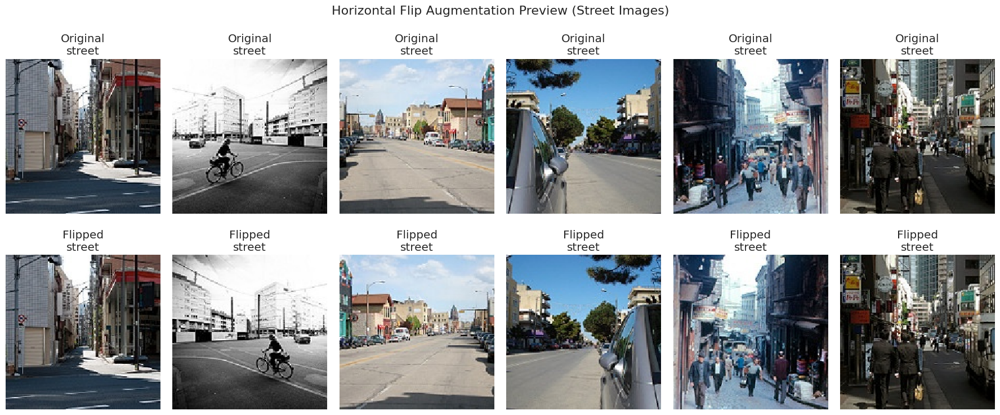

In [ ]:
def preview_horizontal_flip(data_dir, target_size=(224, 224), num_images=6, output_path="aug_flip.png"):
    from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
    import matplotlib.pyplot as plt
    import numpy as np
    import os
    import random

    datagen = ImageDataGenerator(horizontal_flip=True)

    # Force use of 'street' class for clear visual flips
    class_choice = "street"
    img_folder = os.path.join(data_dir, class_choice)
    all_files = [f for f in os.listdir(img_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # Pick random images only from 'street'
    sample_images = random.sample(all_files, num_images)

    plt.figure(figsize=(18, 8))
    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(img_folder, img_file)
        img = load_img(img_path, target_size=target_size)
        img_array = img_to_array(img)
        img_array_expanded = np.expand_dims(img_array, axis=0)

        flipped_img = next(datagen.flow(img_array_expanded, batch_size=1))[0].astype("uint8")

        # Original
        plt.subplot(2, num_images, i + 1)
        plt.imshow(img_array.astype("uint8"))
        plt.title(f"Original\n{class_choice}")
        plt.axis('off')

        # Flipped
        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow(flipped_img)
        plt.title(f"Flipped\n{class_choice}")
        plt.axis('off')

    plt.suptitle("Horizontal Flip Augmentation Preview (Street Images)", fontsize=16)
    plt.tight_layout()
    plt.savefig(output_path)
    print(f"✅ Horizontal flip augmentation saved as: {output_path}")
    plt.show()

# Run it!
preview_horizontal_flip("/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_train/seg_train")


# **Zoom & Crop Augmentation Preview**

✅ Zoom augmentation saved as: aug_zoom.png


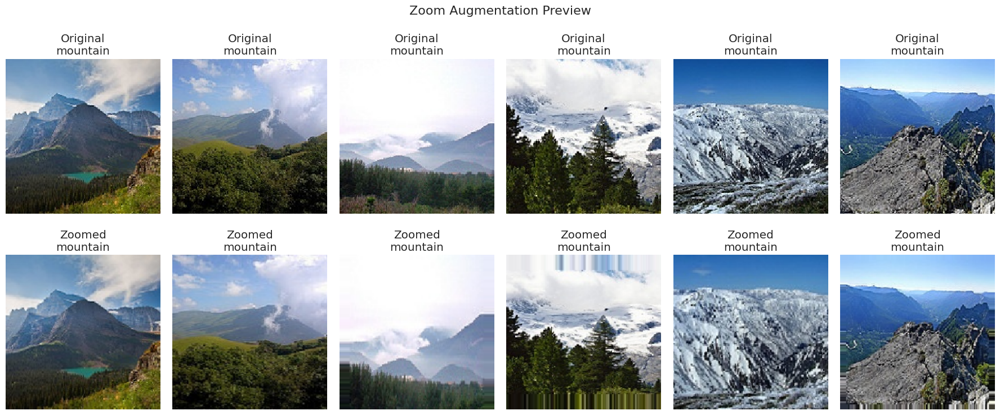

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import matplotlib.pyplot as plt
import numpy as np
import random
import os

def preview_zoom_augmentation(data_dir, target_size=(224, 224), num_images=6, output_path="aug_zoom.png"):
    datagen = ImageDataGenerator(zoom_range=0.3)  # Zoom in 0–30%

    # Choose a visually rich class (e.g., 'mountain' or 'forest')
    class_choice = "mountain"
    img_folder = os.path.join(data_dir, class_choice)
    all_files = [f for f in os.listdir(img_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    sample_images = random.sample(all_files, num_images)

    plt.figure(figsize=(18, 8))
    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(img_folder, img_file)
        img = load_img(img_path, target_size=target_size)
        img_array = img_to_array(img)
        img_array_expanded = np.expand_dims(img_array, axis=0)

        zoomed_img = next(datagen.flow(img_array_expanded, batch_size=1))[0].astype("uint8")

        # Original
        plt.subplot(2, num_images, i + 1)
        plt.imshow(img_array.astype("uint8"))
        plt.title(f"Original\n{class_choice}")
        plt.axis('off')

        # Zoomed
        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow(zoomed_img)
        plt.title(f"Zoomed\n{class_choice}")
        plt.axis('off')

    plt.suptitle("Zoom Augmentation Preview", fontsize=16)
    plt.tight_layout()
    plt.savefig(output_path)
    print(f"✅ Zoom augmentation saved as: {output_path}")
    plt.show()

preview_zoom_augmentation("/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_train/seg_train")


# **Gaussian Blur**

✅ Blur augmentation saved as: aug_blur.png


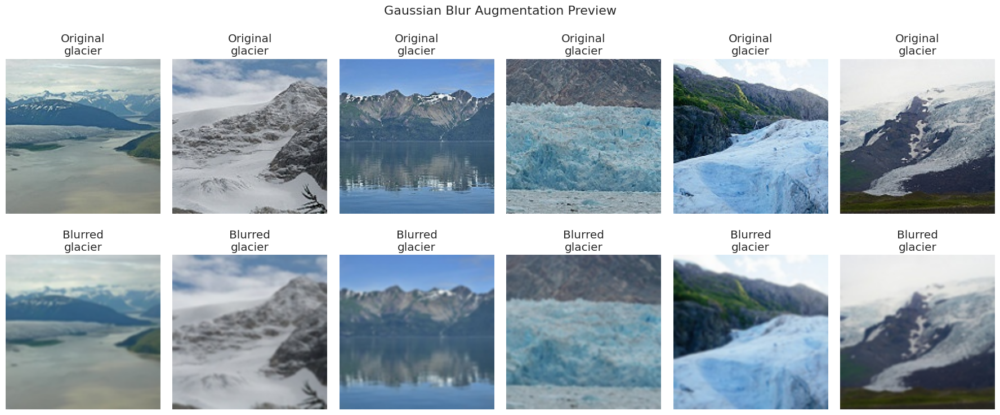

In [ ]:
def apply_blur(image_path, ksize=(5, 5)):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    blurred = cv2.GaussianBlur(img_rgb, ksize, 0)
    return img_rgb, blurred

def preview_blur_augmentation(data_dir, num_images=6, output_path="aug_blur.png"):
    class_choice = "glacier"  # visually sharp class works well
    img_folder = os.path.join(data_dir, class_choice)
    all_files = [f for f in os.listdir(img_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    sample_images = random.sample(all_files, num_images)

    plt.figure(figsize=(18, 8))
    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(img_folder, img_file)
        original, blurred = apply_blur(img_path)

        # Original
        plt.subplot(2, num_images, i + 1)
        plt.imshow(original)
        plt.title(f"Original\n{class_choice}")
        plt.axis('off')

        # Blurred
        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow(blurred)
        plt.title(f"Blurred\n{class_choice}")
        plt.axis('off')

    plt.suptitle("Gaussian Blur Augmentation Preview", fontsize=16)
    plt.tight_layout()
    plt.savefig(output_path)
    print(f"✅ Blur augmentation saved as: {output_path}")
    plt.show()

# Run it
preview_blur_augmentation("/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_train/seg_train")


# **Data Preprocessing Pipeline for Model Training**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define paths
train_dir = "/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_train/seg_train"

# Image size & batch settings
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Augmentations for training set
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # 80% train, 20% validation
)

#  No augmentation for validation, only rescaling
val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Create the generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

val_generator = val_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)


Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.


# **Visualize Augmented Images from Generator**

 Augmented batch preview saved as: batch_preview.png


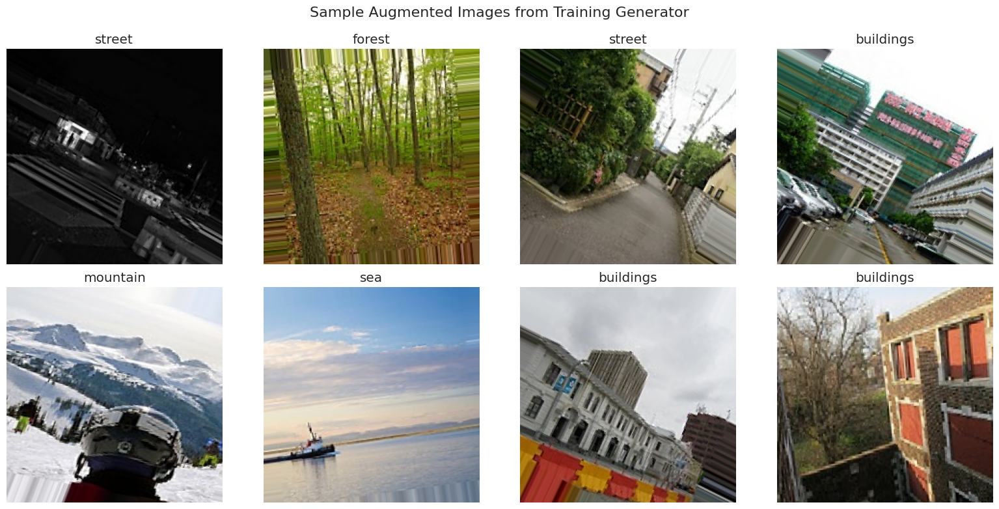

In [ ]:
import matplotlib.pyplot as plt

def preview_augmented_batch(generator, class_names, output_path="batch_preview.png"):
    images, labels = next(generator)  # Get one batch

    plt.figure(figsize=(16, 8))
    for i in range(8):
        plt.subplot(2, 4, i + 1)
        plt.imshow(images[i])
        label_index = labels[i].argmax()
        plt.title(class_names[label_index])
        plt.axis('off')

    plt.suptitle("Sample Augmented Images from Training Generator", fontsize=16)
    plt.tight_layout()
    plt.savefig(output_path)
    print(f" Augmented batch preview saved as: {output_path}")
    plt.show()

# Class labels from generator
class_names = list(train_generator.class_indices.keys())

# 🔁 Run it
preview_augmented_batch(train_generator, class_names)


# **Model Implementation**

**ResNet50 Transfer Learning**

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam

def build_resnet_model(input_shape=(224, 224, 3), num_classes=6, learning_rate=0.0001):
    base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))
    base_model.trainable = False  # Freeze base layers

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    output = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output)

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print("✅ ResNet50 model built and compiled.")
    return model

# Build the model
resnet_model = build_resnet_model()
resnet_model.summary()


✅ ResNet50 model built and compiled.


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,850,758 (90.98 MB)

 Trainable params: 263,046 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

**Train RestNet50**

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# 🔧 Callbacks
checkpoint_path = "resnet50_best_model.h5"

checkpoint = ModelCheckpoint(
    checkpoint_path,
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# 📊 Train the model
history = resnet_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    steps_per_epoch=20,
    validation_steps=10,
    callbacks=[checkpoint, early_stop],
    verbose=1
)


Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1870 - loss: 1.9827
Epoch 1: val_accuracy improved from -inf to 0.09687, saving model to resnet50_best_model.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 219s 11s/step - accuracy: 0.1874 - loss: 1.9818 - val_accuracy: 0.0969 - val_loss: 1.6378
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1951 - loss: 1.9431
Epoch 2: val_accuracy did not improve from 0.09687
20/20 ━━━━━━━━━━━━━━━━━━━━ 212s 11s/step - accuracy: 0.1953 - loss: 1.9421 - val_accuracy: 0.0719 - val_loss: 1.6988
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1552 - loss: 1.9267
Epoch 3: val_accuracy did not improve from 0.09687
20/20 ━━━━━━━━━━━━━━━━━━━━ 210s 11s/step - accuracy: 0.1557 - loss: 1.9262 - val_accuracy: 0.0719 - val_loss: 1.6871
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.2054 - loss: 1.8299
Epoch 4: val_accuracy did not improve from 0.09687
20/20 ━━━━━━━━━━━━━━━━━━━━ 260s 13s/step - accuracy: 0.2054 - loss: 1.8302 - val_accuracy: 0.0031 - val_loss: 1.7694
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.2215 - loss: 1.8516
Epoch 5: val_accuracy improved from 0.09687 to 

20/20 ━━━━━━━━━━━━━━━━━━━━ 211s 11s/step - accuracy: 0.2210 - loss: 1.8509 - val_accuracy: 0.1219 - val_loss: 1.6482
Epoch 6/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.2007 - loss: 1.7956
Epoch 6: val_accuracy did not improve from 0.12188
20/20 ━━━━━━━━━━━━━━━━━━━━ 263s 13s/step - accuracy: 0.2010 - loss: 1.7957 - val_accuracy: 0.0000e+00 - val_loss: 1.6670
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.


# **Fine Tuning the Rest-Net Model**

In [ ]:
# Safely access the first layer as the base ResNet50 model
base_model = resnet_model.layers[0]

#  Unfreeze base ResNet50
base_model.trainable = True

# Re-compile with lower learning rate
resnet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune the model
fine_tune_history = resnet_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=5,
    steps_per_epoch=20,
    validation_steps=10,
    callbacks=[checkpoint, early_stop],
    verbose=1
)


Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1568 - loss: 1.9652
Epoch 1: val_accuracy did not improve from 0.12188
20/20 ━━━━━━━━━━━━━━━━━━━━ 256s 11s/step - accuracy: 0.1576 - loss: 1.9637 - val_accuracy: 0.0562 - val_loss: 1.6429
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1986 - loss: 1.9161
Epoch 2: val_accuracy did not improve from 0.12188
20/20 ━━━━━━━━━━━━━━━━━━━━ 259s 13s/step - accuracy: 0.1983 - loss: 1.9152 - val_accuracy: 0.0125 - val_loss: 1.6654
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1795 - loss: 1.9607
Epoch 3: val_accuracy did not improve from 0.12188
20/20 ━━━━━━━━━━━━━━━━━━━━ 212s 11s/step - accuracy: 0.1792 - loss: 1.9600 - val_accuracy: 0.0125 - val_loss: 1.6722
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1420 - loss: 1.9134
Epoch 4: val_accuracy did not improve from 0.12188
20/20 ━━━━━━━━━━━━━━━━━━━━ 261s 13s/step - accuracy: 0.1434 - loss: 1.9125 - val_accuracy: 0.0156 - val_loss: 1.6461


# **Model Evaluation**

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 224, 224, 3))
  warnings.warn(msg)


88/88 ━━━━━━━━━━━━━━━━━━━━ 827s 9s/step
              precision    recall  f1-score   support

   buildings       0.81      0.03      0.06       438
      forest       0.00      0.00      0.00       454
     glacier       0.00      0.00      0.00       480
    mountain       0.00      0.00      0.00       502
         sea       0.76      0.21      0.33       454
      street       0.18      0.99      0.30       476

    accuracy                           0.21      2804
   macro avg       0.29      0.21      0.12      2804
weighted avg       0.28      0.21      0.11      2804



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


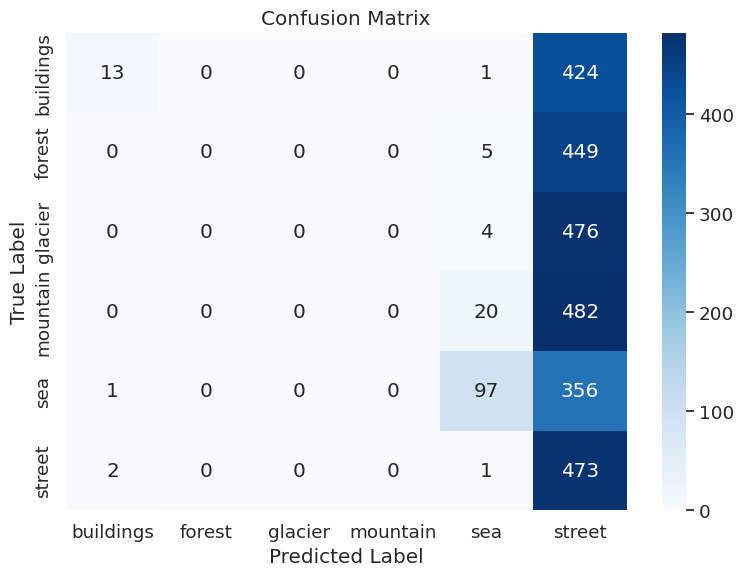

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Predict on validation data
val_generator.reset()
pred_probs = resnet_model.predict(val_generator, steps=val_generator.samples // val_generator.batch_size + 1)
pred_classes = np.argmax(pred_probs, axis=1)
true_classes = val_generator.classes
class_labels = list(val_generator.class_indices.keys())

# Step 2: Print classification report
print(classification_report(true_classes, pred_classes, target_names=class_labels))

#  Step 3: Confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# 🎨 Step 4: Plot
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.savefig("confusion_matrix.png")
plt.show()


# **Grad_CAM Visualization**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
import os

def get_img_array(img_path, size):
    img = image.load_img(img_path, target_size=size)
    array = image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return tf.keras.applications.resnet50.preprocess_input(array)

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = cv2.addWeighted(img, 1 - alpha, heatmap_color, alpha, 0)
    cv2.imwrite(cam_path, superimposed)
    plt.imshow(cv2.cvtColor(superimposed, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Grad-CAM Heatmap")
    plt.show()


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


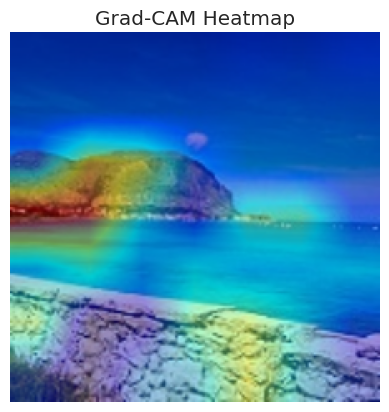

In [ ]:
# Replace with a real image path from your validation or test set
img_path = "/content/drive/MyDrive/Colab Notebooks/intel_image_classification/seg_test/seg_test/sea/24325.jpg"

img_array = get_img_array(img_path, size=(224, 224))
heatmap = make_gradcam_heatmap(img_array, resnet_model, last_conv_layer_name="conv5_block3_out")
display_gradcam(img_path, heatmap, cam_path="gradcam_result.jpg")
